![king county image, from https://www.racialequityalliance.org/jurisdictions/king-county-washington/](https://www.racialequityalliance.org/wp-content/uploads/2016/10/assessors_social-1.jpg)


# King County Real Estate Prices

## Overview-Seattle Affordable Housing Initiative

In response to the housing problems in the King County Area, Amazon is awarding a grant of 60 million dollars to the Low Income Housing Institute(LIHI). LIHI has hired us to create a model that will predict the price of single family homes they are considering aquiring for their housing initiatives.  

## Business Problem

LIHI is a housing organization that purchases homes to lease and rent out at affordable prices to eligble families.
They are in need of a model that will help them predict housing prices across King County before they approach home owners with an offer to buy. With our model, LIHI will be able to disregard innapprorately priced homes and respond with realistics offers. This will direct their energy as they sift through available homes in King County.

## Model Goal

Our goal is to use a multiple linear regression model to help LIHI evaluate which homes are appropriate to buy that will allow them to maximize the purchased number of homes from the grant.





In [116]:
#Imports

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from datetime import datetime
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_validate
from statsmodels.formula.api import ols
import statsmodels.api as sm
from sklearn.preprocessing import OneHotEncoder
from sklearn.datasets import make_regression
import sklearn.metrics as metrics
from scipy import stats as stats
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import r2_score, mean_absolute_error
import folium

import utils
from utils import evaluate



## Data Understanding

The dataset describes around 21,597 homes sold between 2014 and 2015. There are over 20 characteristics listed. Our target variable is price. 

- id 
- date
- price
- bedrooms
- bathrooms
- sqft_living  
- sqft_lot 
- floors
- waterfront
- view 
- condition
- grade 
- sqft_above 
- sqft_basement 
- yr_built
- yr_renovated 
- zipcode 
- lat
- long 
- sqft_living15
- sqft_lot15 



In [117]:
#Reading in our data
df = pd.read_csv('../../data/kc_house_data.csv')

In [118]:
#Looking at column information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  object 
 9   view           21534 non-null  object 
 10  condition      21597 non-null  object 
 11  grade          21597 non-null  object 
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [119]:
#Checking int, float columns
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [120]:
#Looking at null values
df.isna().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

- Null values found in waterfront, view, and yr_renovated.

### First Observations
 - In price, the max price is very significantly larger than the mean. We will look further into the column to evaluate outliers.
 - In bedrooms, there is a large max value indicating an outlier. We will remove later. This column may be treated as  categorical. 
 - In bathrooms, the max value is much higher than most of the dataset. This many bathrooms may be from a building that is not representative of the homes we would like to work with in our model. This column may be treated as categorical.
 - In sqft_living the max value is significantly larger than the mean. This large of a building may not be representative of the homes we would like to work with in our model.
 - In sqft_lot, the max value is significantly larger than a large portion of the dataset. This large of a lot may not be representative of the homes we would like to work with in our model. 
 - In floors, there is a max value that is larger than the majority of our dataset. We may restrict the number of floors in our model. 
 - In yr_built we see homes were build between 1900 and 2015
 - In yr_renovated, 79% of the homes have not been renovated. With such a large percentage of the dataset with no value, this column may be removed later.
 - In zipcode, we see it represented numerically but it will need to be treated categorically.
 - In lat and Long we see the latitude and longitude coordinates of the homes.
 - In sqft_living15 we see the square footage of the interior housing living space of the nearest 15 neighbors.
 - In sqft_lot15 we see the square footage of the land lots of the nearest 15 neighbors.

In [121]:
#Explore object columns
obj_cols = [c for c in df.columns if df[c].dtype == 'object']
df[obj_cols].describe()

,date,waterfront,view,condition,grade,sqft_basement
count,21597,19221,21534,21597,21597,21597
unique,372,2,5,5,11,304
top,6/23/2014,NO,NONE,Average,7 Average,0.0
freq,142,19075,19422,14020,8974,12826


### First Observations

- Date column may need to be reformatted so that we can work with the values
- Waterfront has 11% null values and 88% of the values recorded are no. Only ~1% of the properties have waterfront access
- View has some null values and 90% have a value of none. 
- Condition is an ordinal feature with values of 1 - 5 
- Grade is an ordinal feature with values 3 - 13 
- sqft_basement is being treated as an object when it is an integer. 

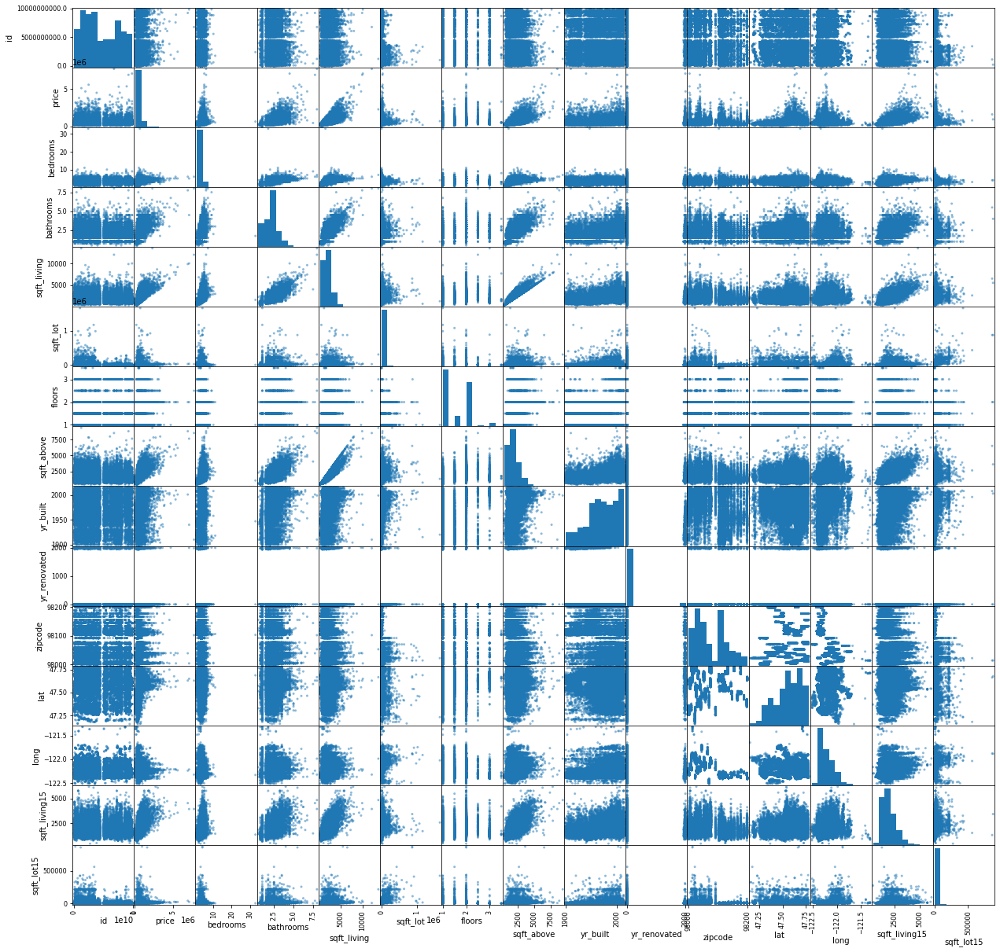

In [122]:
#Scatter matrix of all data to get a quick view of any obvious trends. 
pd.plotting.scatter_matrix(df, figsize = [21,21]);
plt.show()

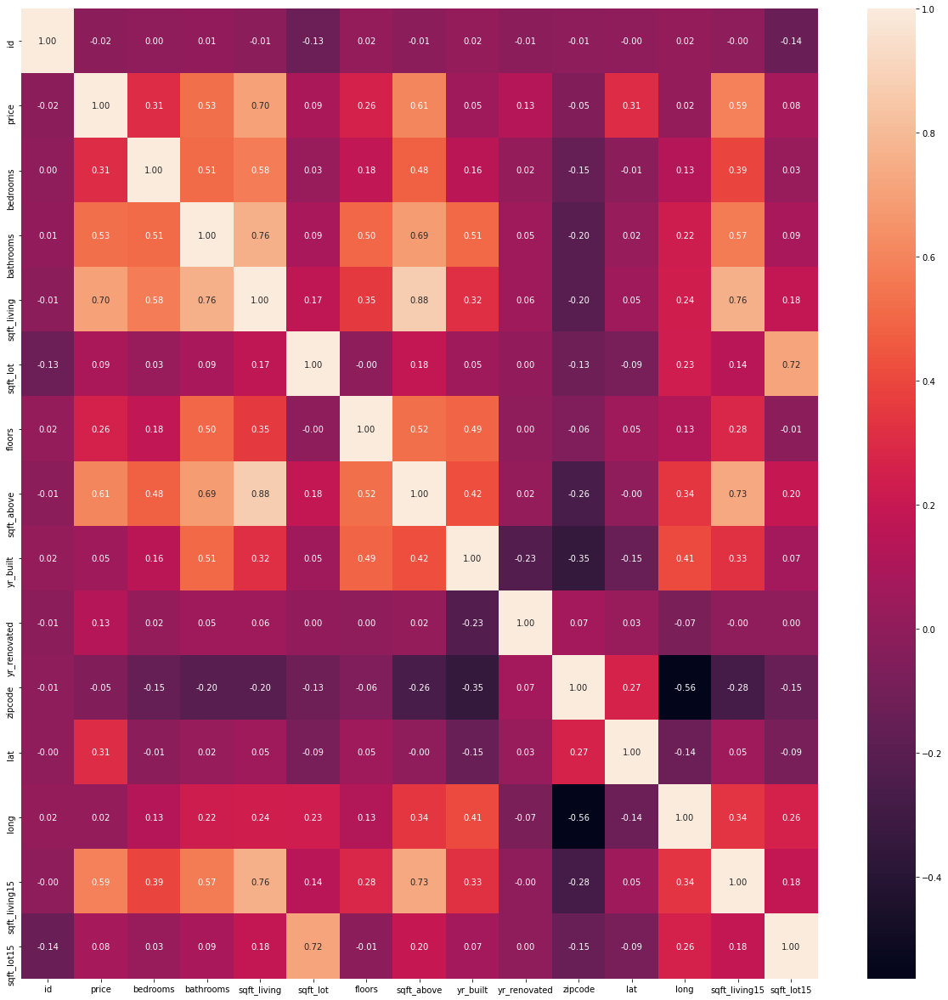

In [123]:
#Initial heatmap highlighing obvious correlations with Price
plt.figure(figsize = (21,21))
sns.heatmap(df.corr(), annot = True, fmt = '.2f');

- sqft_living shows the highest correlation with price 

## Data Preparation


**sqft_basement**
- There are ? values in sq_ft basement, causing it to be categorized as an object. We will remove the values and replace them with a 0.
- Initial analysis showed the sqft basement is the sqft living space minus the sqft above space.

**Dropped Columns:**
- Id, waterfront, View, yr_renovated 
- Id will not be very useful for our analysis. 
- Waterfront properties only represent ~1% of the properties in the dataset and are not significant for our model.
- 90% of the values in view are none. The remaining values are not significant enough to remain in our model.
- 97% of vales in yr_renovated are either null or 0.0

**Restricted Columns**
- Restricting bedroom number to exclude outliers and be more representative of single family homes.
- Restricting bathroom number to exclude outliers and be more representative of single family homes.
- Restricting floor number to exclude outliers and be more representative of single family homes.
- Restricting the square foot living space to be more representative of single family homes.
- restricting the square foot lot space to be more representative of single family homes.
- restricting basement size to be more represenative of single family homes.

**Columns added for expanded analysis**
- sqft_living_per_bathroom added to evaluate the how bathrooms per square foot impacts a house's value




In [124]:
#Creating unique dataframe with restricted values
df_limited  = df

In [125]:
#There are ? values in sq_ft basement, causing it to be categorized as an object. Removing those values.
#Initial analysis showed the sqft basement is the sqft living space minus the sqft above space.
df_limited['sqft_basement'] = df_limited['sqft_living'] - df_limited['sqft_above']


In [126]:
#Dropping Id, waterfront, View, yr_renovated. 
#Id won't be very useful for our analysis. 
#Waterfront properties only represent ~1% of the properties in the dataset and are not significant for our model.
#90% of the values in view are none. The remaining values aren't significant enough to remain in our model.
#97% of vales in yr_renovated are either null or 0.0
df_limited = df.drop(columns = ['id', 'waterfront', 'view', 'yr_renovated'])

In [127]:
#Turning the grade column into a numerical column
grade_df = df_limited[["grade"]]

for i in range(len(grade_df)):
    grade_df.at[i,"grade"] = grade_df.at[i,"grade"][:2]
    grade_df.at[i,"grade"].strip()
    grade_df.at[i,"grade"] = int(grade_df.at[i,"grade"])

grade_df.rename(columns = {'grade': 'num_grade'}, inplace = True)

df_limited = pd.concat([grade_df, df_limited], axis=1)

In [128]:
df_limited['num_grade'] = df_limited['num_grade'].astype(str).astype(int)

In [129]:
#Turning object date into a datetime64 and isolating month
df_limited['date'] = pd.to_datetime(df_limited['date'])


In [130]:
df_limited['month_date'] = df_limited['date'].dt.strftime('%m')

In [131]:
df_limited['month_date'] = df_limited['month_date'].astype(str).astype(int)

In [132]:
#Restricting bedroom number to exclude outliers and be more representative of single family homes.
df_limited = df_limited[(df_limited['bedrooms'] < 6) & (df_limited['bedrooms'] > 1)]

In [133]:
#Restricting bathroom number to exclude outliers and be more representative of single family homes.
df_limited = df_limited[df_limited['bathrooms'] < 5]

In [134]:
#Restricting floor number to exclude outliers and be more representative of single family homes.
df_limited = df_limited[df_limited['floors'] <= 3]

In [135]:
#Restricting the square foot living space 
df_limited = df_limited[df_limited['sqft_living'] < 6000]

In [136]:
#restricting the square foot lot space
df_limited = df_limited[df_limited['sqft_lot'] < 10000]

In [137]:
#restricting basement size
df_limited = df_limited[df_limited['sqft_basement'] < 2000]

In [138]:
df_limited['sqft_living_per_bathroom'] = df_limited['sqft_living']/df_limited['bathrooms']

In [139]:
#adding zipcode to city map
zipcode_city_dict = {"Auburn": (98001,98002,98003,98023,98047,98092),"Bellevue": (98004,98005,98006,98007,98008),
                    "Black Diamond": (98010), "Bothell": (98011,98012,98028), "Carnation":(98014),
                    "Duvall": (980019), "Enumclaw": (98022), "Fall City": (98024), "Issaquah": (98027,98029,98075),
                    "Kent": (98030,98031,98042), "Kirkland": (98033,98034), "Maple Valley": (98038,), "Medina":(98039),
                    "Mercer Island": (98040), "North Bend": (98045), "Ravensdale": (98051), 
                    "Redmond": (98052,98053,98074), "Redondo": (98054), "Renton": (98055,98056,98057,98058,98059),
                    "Snoqualmie": (98065), "Vashon": (98070), "Woodinville": (98072,98077), 
                    "Seattle": (98101,98102,98103,98104,98105,98106,98107,98108,98109,98111,98112,98113,98114,98115,98116,98117,98118,98119,98121,98122,98124,98125,98126,98127,98129,98131,98132,98134,98136,98144,98146,98154,98155,98161,98164,98166,98171,98174,98178,98188,98189),
                     "Shoreline": (98133,98177),
                     "Seatac": (98148,98158,98168)
                    }
zipcode_city_dict = {
                    98001:"Auburn",98002:"Auburn",98003:"Auburn",98023:"Auburn",98047:"Auburn",98092:"Auburn", 
                    98004:"Bellevue",98005:"Bellevue",98006:"Bellevue",98007:"Bellevue",98008:"Bellevue",
                    98010:"Black Diamond", 98011:"Bothell",98012:"Bothell",98028:"Bothell", 98014:"Carnation",
                    980019:"Duvall", 98022:"Enumclaw", 98024:"Fall City" , 98027:"Issaquah",98029:"Issaquah",
                    98075:"Issaquah",98030:"Kent", 98031:"Kent",98042:"Kent", 98033:"Kirkland",98034:"Kirkland",
                    98038:"Maple Valley", 98039:"Medina", 98040:"Mercer Island", 98045:"North Bend", 
                    98051:"Ravensdale", 98052:"Redmond",98053:"Redmond",98074:"Redmond", 98054:"Redondo", 
                    98055:"Renton",98056:"Renton",98057:"Renton",98058:"Renton",98059:"Renton",
                    98065:"Snoqualmie", 98070:"Vashon", 98072:"Woodinville",98077:"Woodinville", 
                    98101:"Seattle",98102:"Seattle",98103:"Seattle",98104:"Seattle",98105:"Seattle",
                    98106:"Seattle",98107:"Seattle",98108:"Seattle",98109:"Seattle",98111:"Seattle",98112:"Seattle",
                    98113:"Seattle",98114:"Seattle",98115:"Seattle",98116:"Seattle",98117:"Seattle",98118:"Seattle",
                    98119:"Seattle", 98121:"Seattle",98122:"Seattle",98124:"Seattle",98125:"Seattle",98126:"Seattle",
                    98127:"Seattle",98129:"Seattle",98131:"Seattle",98132:"Seattle",98134:"Seattle",98136:"Seattle",
                    98144:"Seattle",98146:"Seattle",98154:"Seattle",98155:"Seattle",98161:"Seattle",98164:"Seattle",
                    98166:"Seattle",98171:"Seattle",98174:"Seattle",98178:"Seattle",98188:"Seattle",98189:"Seattle",
                    98133:"Shoreline",98177:"Shoreline", 98148:"Seatac",98158:"Seatac",98168:"Seatac"
                    }
df_limited['city'] = [[] for x in range(len(df_limited))]
for index,row in df_limited.iterrows():
    for zip_, city in zipcode_city_dict.items():
            if df_limited["zipcode"][index] == zip_:
                df_limited["city"][index] = city



In [140]:
#Changing King County city name to string for workability
df_limited["city"] = df_limited["city"].astype(str)


Text(0.5, 1.0, 'Mean Home Price per City in Kings County')

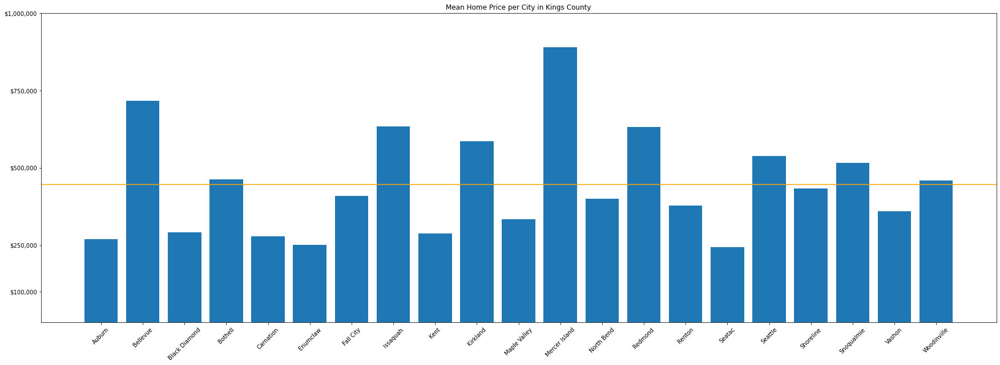

In [246]:
#Mean home price per city in Kings County, removing Medina

avg_price_city = df_limited.groupby(["city"])["price"].mean().round(2)
df_city_price = pd.DataFrame()
df_city_price["city"] = avg_price_city.index
df_city_price["mean_price"] = avg_price_city.values
df_city_price = df_city_price[df_city_price["city"] != "[]"]
#We are removing Medina because it is not an area of interest due to the innaffordability of housing.
df_city_price = df_city_price[df_city_price["city"] != "Medina"]
fig, ax = plt.subplots(figsize=(30,10))
ax.bar(df_city_price["city"],df_city_price["mean_price"])
ax.set_yticks([100000,250000,500000,750000,1000000])
ax.set_yticklabels(['$100,000','$250,000','$500,000','$750,000','$1,000,000'])
plt.xticks(rotation=45);
ax.axhline(y=df_city_price['mean_price'].mean(), color = 'orange')
ax.set_title('Mean Home Price per City in Kings County')

In [144]:
# visualize Kings County real estate market

#graph mean price over zipcode

avg_price_zipcode = df.groupby("zipcode")["price"].mean().round(2)




df_zip_price = pd.DataFrame()

df_zip_price["zipcode"] = avg_price_zipcode.index
df_zip_price["mean_price"] = avg_price_zipcode.values

df_zip_price["zipcode"] = df_zip_price["zipcode"].astype(str)



max_mean = df_zip_price["mean_price"].max()
#map the mean sales price data



map = folium.Map(location = [47.56,-122.26],default_zoom_start = .5)


map.choropleth(geo_data="../../../HomeSalesAnalysis/data/Zipcodes_for_King_County_and_Surrounding_Area___zipcode_area.geojson",data = df_zip_price, columns = ['zipcode','mean_price'],key_on='feature.properties.ZIPCODE',fill_color= "YlOrBr", fill_opacity =0.6,line_opacity=0.2,legend_name = 'MEAN SALE PRICE',highlight=True,overlay=True,threshold_scale = [0,int((max_mean*.2)),int((max_mean/3)),int((max_mean/2)),int((max_mean*.65)),int((max_mean*.75)),int((max_mean*.9)),max_mean+1])

map

Text(0.5, 1.0, 'Mean Home Price per Zipcode in Seattle')

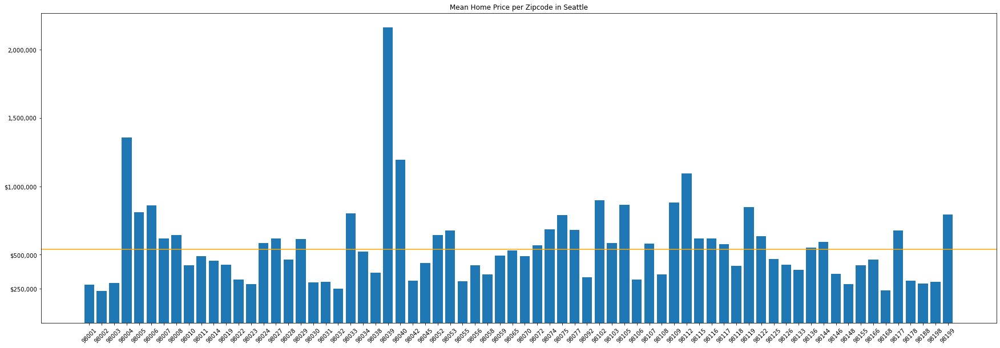

In [83]:
fig, ax = plt.subplots(figsize=(30,10))

ax.bar(df_zip_price["zipcode"],df_zip_price["mean_price"])
ax.set_yticks([250000,500000,1000000,1500000,2000000])
ax.set_yticklabels(['$250,000','$500,000','$1,000,000','1,500,000','2,000,000'])
plt.xticks(rotation=45);
ax.axhline(y=df["price"].mean(), color = "orange")
ax.set_title("Mean Home Price per Zipcode in Seattle")

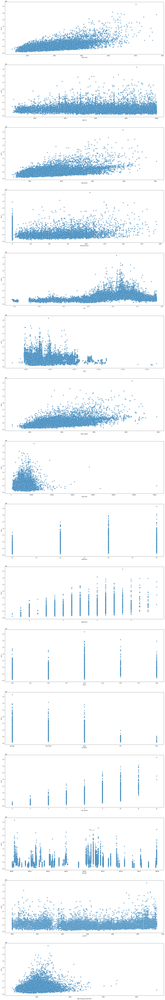

In [25]:
#Creating scatter plots of our numeric variables against price to look for outliers or signs of categories
features = [
     "sqft_living", "sqft_lot", "sqft_above", "sqft_basement", "lat", "long",
    "sqft_living15", "sqft_lot15", "bedrooms", "bathrooms", "floors", 
     "condition", "num_grade", "zipcode", "yr_built","sqft_living_per_bathroom"
    
]


fig = plt.figure(figsize=(25, len(features)*10))
for i, col in enumerate(features):
    ax = fig.add_subplot(len(features), 1, i + 1)
    if col in features:
        sns.scatterplot(x=col, y="price", data=df_limited, ax=ax, alpha=0.5, s=100)

## Modeling



To begin our model, we performed a train test split. We used a test size of 25%. 




In [26]:
#Setting our X and Y for our train test split. 
X = df_limited.drop(columns = 'price')
y = df_limited['price']

In [27]:
#Performing train test split using test size of 25%
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = .25, random_state = 42)

In [47]:
#Setting up the standard scaler for use on necessary models
scaler = StandardScaler()

In [48]:
#Setting up the log of our price column to normalize the skew. This will be used on scaled models
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

Taking a closer look at the characteristics of our Train and Test sets.

In [28]:
print("X Train:")
display(X_train.describe())
print("X Test:")
display(X_test.describe())

X Train:


,num_grade,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,month_date,sqft_living_per_bathroom
count,11266.000000,11266.000000,11266.000000,11266.000000,11266.000000,11266.00000,11266.000000,11266.000000,11266.000000,11266.000000,11266.000000,11266.000000,11266.000000,11266.000000,11266.000000,11266.000000
mean,7.489082,3.282443,2.041563,1899.376531,6032.844843,1.52370,1640.979851,258.396680,1970.246760,98085.694124,47.564480,-122.238435,1842.111042,6251.171312,6.561246,964.935197
std,0.984440,0.802087,0.713860,732.944418,2369.106370,0.55598,681.443437,383.859476,31.941058,52.736281,0.135058,0.130230,578.107530,2646.512712,3.117698,281.817330
min,4.000000,2.000000,0.500000,440.000000,520.000000,1.00000,440.000000,0.000000,1900.000000,98001.000000,47.189600,-122.512000,460.000000,651.000000,1.000000,300.000000
25%,7.000000,3.000000,1.500000,1360.000000,4400.000000,1.00000,1140.000000,0.000000,1948.000000,98038.000000,47.486600,-122.343000,1430.000000,4500.250000,4.000000,771.428571
50%,7.000000,3.000000,2.000000,1780.000000,6180.000000,1.50000,1460.000000,0.000000,1973.000000,98103.000000,47.576500,-122.283000,1720.000000,6211.500000,6.000000,928.000000
75%,8.000000,4.000000,2.500000,2320.000000,7930.000000,2.00000,2000.000000,500.000000,2001.000000,98119.000000,47.679675,-122.163000,2150.000000,8000.000000,9.000000,1120.000000
max,12.000000,5.000000,4.750000,5780.000000,9999.000000,3.00000,5040.000000,1950.000000,2015.000000,98199.000000,47.777600,-121.319000,4950.000000,70973.000000,12.000000,3410.000000


X Test:


,num_grade,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,month_date,sqft_living_per_bathroom
count,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000,3756.000000
mean,7.489084,3.267838,2.051251,1906.298988,6048.998935,1.523163,1648.162939,258.136049,1970.419862,98085.515176,47.563839,-122.238432,1843.416933,6272.437966,6.631523,962.848666
std,0.994332,0.798226,0.719221,744.923026,2374.364229,0.557597,686.024258,385.915336,31.777559,53.006585,0.136009,0.130400,581.537536,2622.846638,3.125431,283.932566
min,4.000000,2.000000,0.500000,580.000000,572.000000,1.000000,480.000000,0.000000,1900.000000,98001.000000,47.189600,-122.446000,620.000000,660.000000,1.000000,265.454545
25%,7.000000,3.000000,1.500000,1350.000000,4400.000000,1.000000,1140.000000,0.000000,1948.000000,98034.000000,47.479975,-122.347000,1420.000000,4519.250000,4.000000,770.000000
50%,7.000000,3.000000,2.000000,1780.000000,6282.000000,1.500000,1460.000000,0.000000,1973.000000,98103.000000,47.576450,-122.282000,1730.000000,6346.000000,7.000000,930.954545
75%,8.000000,4.000000,2.500000,2333.250000,7928.500000,2.000000,2020.000000,500.000000,2001.000000,98119.000000,47.679700,-122.165000,2160.000000,8025.000000,9.000000,1110.192308
max,11.000000,5.000000,4.500000,5635.000000,9997.000000,3.000000,4500.000000,1910.000000,2015.000000,98199.000000,47.777600,-121.352000,4510.000000,38211.000000,12.000000,4600.000000


We moved to creating histograms of all of our columns to evaluate their skew. This was done to inform which columns we would need to log scale later. We we also looking for differences between the distribution in our test and train set.

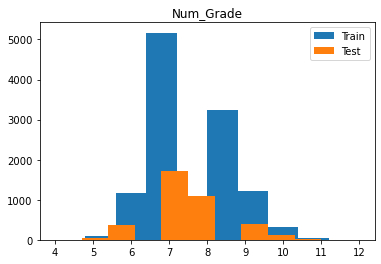

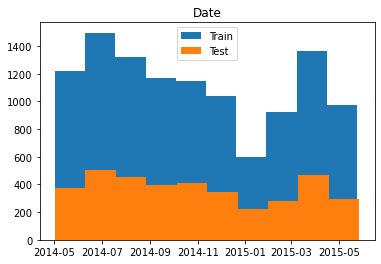

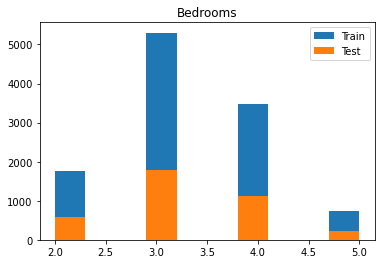

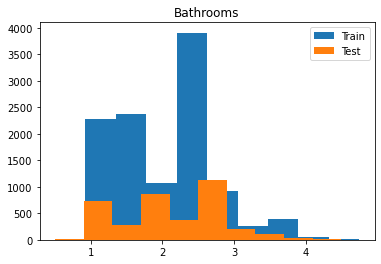

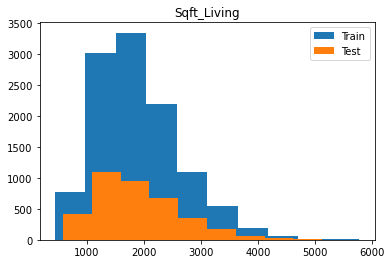

...

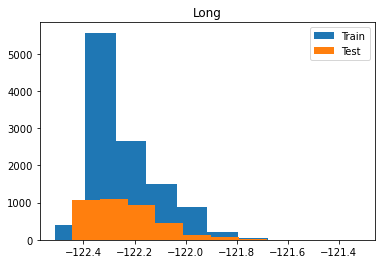

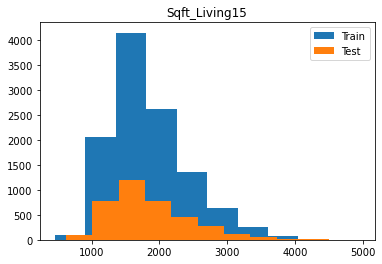

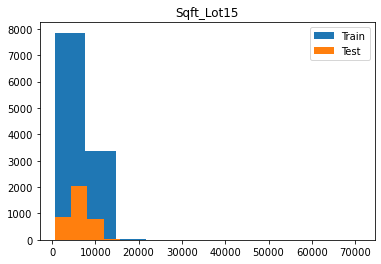

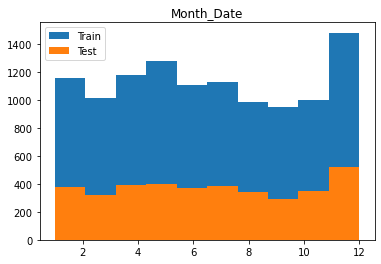

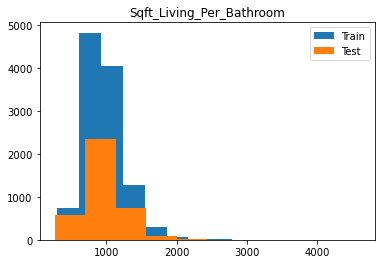

In [29]:
#We created histograms of all of our columns in

used_cols = [c for c in df_limited.columns if c not in ['price']]

for col in used_cols:
    plt.hist(X_train[col], label = 'Train')
    plt.hist(X_test[col], label = 'Test')
    plt.title(f"{col.title()}")
    plt.legend()
    plt.show()

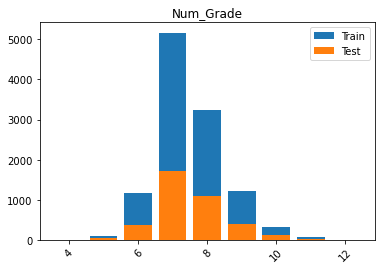

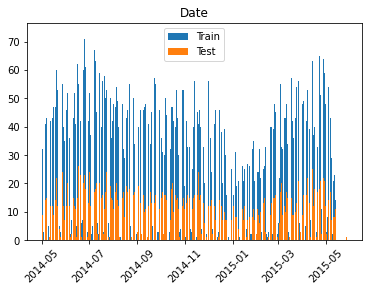

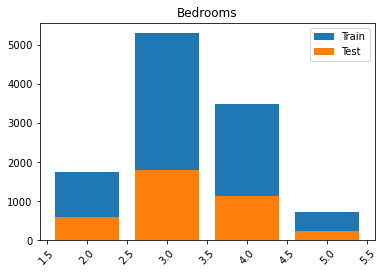

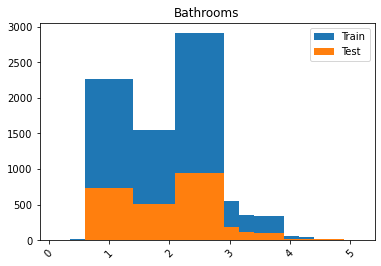

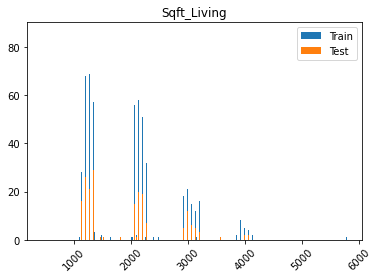

...

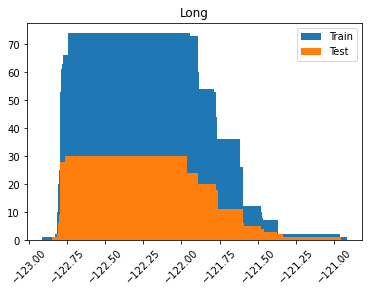

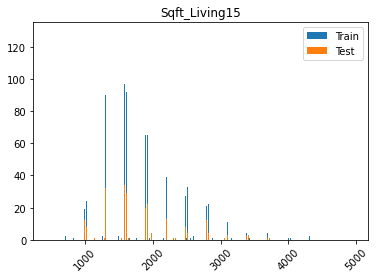

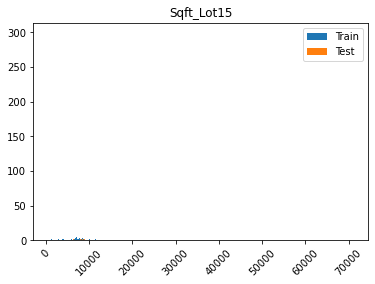

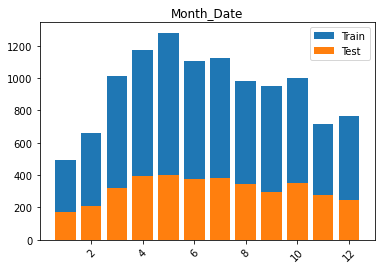

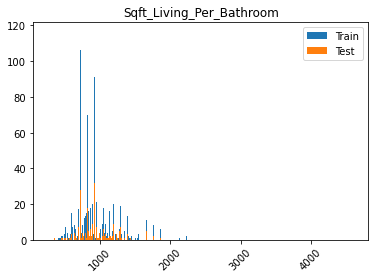

In [30]:
for col in used_cols:
    train_values = X_train[col].value_counts()
    test_values = X_test[col].value_counts()
    plt.bar(train_values.index, train_values, label = 'Train')
    plt.bar(test_values.index, test_values, label = 'Test')
    plt.title(f"{col.title()}")
    plt.xticks(rotation = 45)
    plt.legend()
    plt.show()

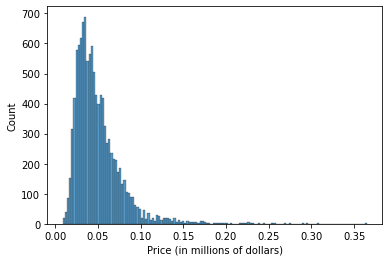

In [31]:
#Our plot shows it is skewed right on price
sns.histplot(y_train/10000000)
plt.xlabel("Price (in millions of dollars)");

<AxesSubplot:>

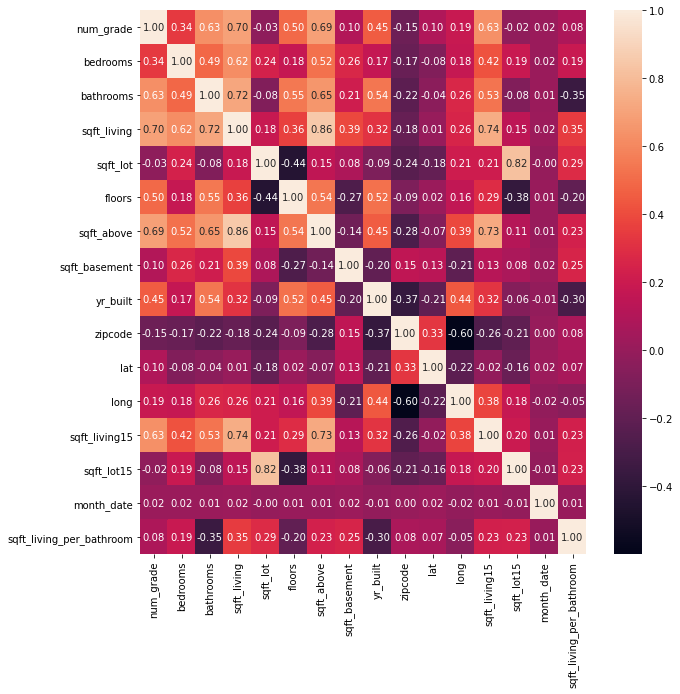

In [32]:
#Heat map to look at the correlation coefficients in our training dataset. 
plt.figure(figsize = (10,10))
sns.heatmap(X_train.corr(), annot = True, fmt = '.2f')

In [34]:
train_df = pd.concat([X_train, y_train], axis = 1)

<AxesSubplot:>

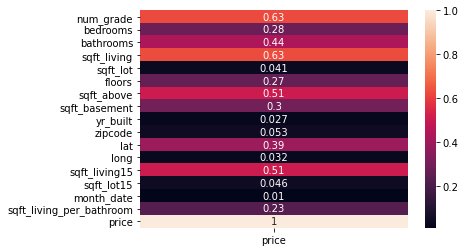

In [35]:
#Heat map of the absolute value of correlation of features to price.
sns.heatmap(abs(train_df.corr())[['price']], annot = True)

### Baseline Understanding

- Our baseline model R2, RMSE, and MAE

In [203]:
#Setting the mean value of our y training set. This is the mean of the price in the training set. 
train_target_mean = y_train.mean()
train_target_mean

493902.44851766375

In [204]:
#Using the training mean to build our inital prediction.
baseline_train_preds = [train_target_mean] * len(y_train)
baseline_test_preds = [train_target_mean] * len(y_test)

In [205]:
#Getting the R2 score, RMSE, and MAE of our baseline model
print(f"Train R2: {r2_score(y_train, baseline_train_preds)}")
print(f"Test R2: {r2_score(y_test, baseline_test_preds)}")
print('****')
print(f"Train RMSE: {mean_squared_error(y_train, baseline_train_preds, squared = False)}")
print(f"Test RMSE: {mean_squared_error(y_test, baseline_test_preds, squared = False)}") 
print('****')
print(f"Train MAE: ${mean_absolute_error(y_train, baseline_train_preds):,.2f}")
print(f"Test MAE: ${mean_absolute_error(y_test, baseline_test_preds):,.2f}")

Train R2: 0.0
Test R2: -0.0003910904486172928
****
Train RMSE: 273002.09436628764
Test RMSE: 269206.65743350127
****
Train MAE: $192,410.05
Test MAE: $189,541.67


Our model-less prediction shows that we are finding a **RMSE** of \\$273,002.09 in our training set and \\$269,206.66 in our test set. Our **MAE** is very high at \\$192,410.05 in our training set and \\$189,541.67 in our test set.

### First Model

Our first model used the feature with the highest correlation to price. Initially we will see the quality of model produced by only using the square foot living space to predict price.

In [39]:
#Our first model using the feature with highest correlation to price
fsm_X_train = X_train['sqft_living']
fsm_X_test = X_test['sqft_living']

In [40]:
#Using stats models Ordinary Least Squares and fitting it to our first model using highest correlation to price.
fsm = sm.OLS(y_train, sm.add_constant(fsm_X_train)).fit()
fsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.396
Model:                            OLS   Adj. R-squared:                  0.396
Method:                 Least Squares   F-statistic:                     7384.
Date:                Thu, 07 Oct 2021   Prob (F-statistic):               0.00
Time:                        22:42:32   Log-Likelihood:            -1.5417e+05
No. Observations:               11266   AIC:                         3.083e+05
Df Residuals:                   11264   BIC:                         3.083e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        4.869e+04   5553.206      8.769      0.000    3.78e+04    5.96e+04
sqft_living   234.3972      2.728     85.933      0.000     229.051     239.744
==============================================================================
Omnibus:                     4512.596   Durbin-Watson:                   1.981
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            38456.314
Skew:                           1.696   Prob(JB):                         0.00
Kurtosis:                      11.391   Cond. No.                     5.66e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.66e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [41]:
#Establishing the X training and test variables used in our prediction.
fsm_train_preds = fsm.predict(sm.add_constant(fsm_X_train))
fsm_test_preds = fsm.predict(sm.add_constant(fsm_X_test))

Train R2: 0.3960
Test R2: 0.3779
****
Train RMSE: $212,173.22
Test RMSE: $212,296.55
****
Train MAE: $153,922.90
Test MAE: $151,960.12


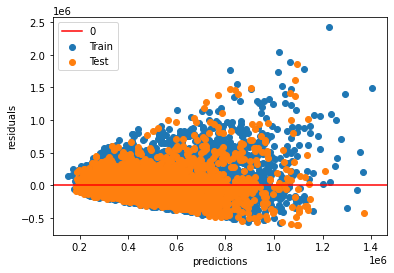

In [42]:
#Using our evaluate function to return the R2, RMSE and MAE
evaluate(y_train, fsm_train_preds, y_test, fsm_test_preds)

### First Model Evaluation
- Our first model accounts for around 40% of the varience in our data, a massive improvement from the baseline model.
- The RMSE has dropped
- The MAE has dropped, showing a better fit in our model.
- Our scatter plot shows heteroscedasticity

## Modeling Iterations

From our first model, we wanted to see how our model will improve as we add in other highly correlated features. 

In [206]:
#Iteration using the top two correlated features
X_train_1 = X_train[['sqft_living','num_grade']]
X_test_1 = X_test[['sqft_living','num_grade']]

In [207]:
#Fitting our model and getting our first look at the performance
model_1 = sm.OLS(y_train, sm.add_constant(X_train_1)).fit()
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.465
Model:                            OLS   Adj. R-squared:                  0.465
Method:                 Least Squares   F-statistic:                     4902.
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        08:52:33   Log-Likelihood:            -1.5348e+05
No. Observations:               11266   AIC:                         3.070e+05
Df Residuals:                   11263   BIC:                         3.070e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -5.343e+05   1.61e+04    -33.155      0.000   -5.66e+05   -5.03e+05
sqft_living   138.4554      3.589     38.579      0.000     131.421     145.490
num_grade    1.022e+05   2672.020     38.242      0.000    9.69e+04    1.07e+05
==============================================================================
Omnibus:                     4634.858   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            42091.960
Skew:                           1.731   Prob(JB):                         0.00
Kurtosis:                      11.814   Cond. No.                     1.77e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.77e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [208]:
X_train_1_preds = model_1.predict(sm.add_constant(X_train_1))
X_test_1_preds = model_1.predict(sm.add_constant(X_test_1))

Train R2: 0.4654
Test R2: 0.4603
****
Train RMSE: $199,609.66
Test RMSE: $197,724.94
****
Train MAE: $143,999.46
Test MAE: $142,331.36


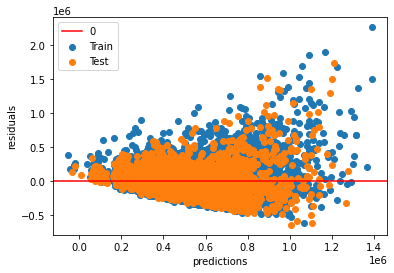

In [209]:
evaluate(y_train, X_train_1_preds, y_test, X_test_1_preds)

### Iteration 1 Evaluation
- Our first model accounts for around 47% of the varience in our data, a 7% improvement from the first model.
- The RMSE has dropped
- The MAE has dropped, showing a better fit in our model.
- Our scatter plot shows heteroscedasticity

### Iteration 2

In [210]:
#Iteration using the top three correlated features
X_train_2 = X_train[['sqft_living','num_grade','sqft_living15']]
X_test_2 = X_test[['sqft_living','num_grade','sqft_living15']]

In [211]:
model_2 = sm.OLS(y_train, sm.add_constant(X_train_2)).fit()
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.465
Model:                            OLS   Adj. R-squared:                  0.465
Method:                 Least Squares   F-statistic:                     3268.
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        08:52:41   Log-Likelihood:            -1.5348e+05
No. Observations:               11266   AIC:                         3.070e+05
Df Residuals:                   11262   BIC:                         3.070e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -5.344e+05   1.61e+04    -33.159      0.000   -5.66e+05   -5.03e+05
sqft_living     140.1231      4.261     32.883      0.000     131.770     148.476
num_grade      1.027e+05   2753.180     37.289      0.000    9.73e+04    1.08e+05
sqft_living15    -3.6256      4.994     -0.726      0.468     -13.416       6.164
==============================================================================
Omnibus:                     4638.230   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            42099.173
Skew:                           1.733   Prob(JB):                         0.00
Kurtosis:                      11.813   Cond. No.                     2.42e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.42e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [212]:
X_train_2_preds = model_2.predict(sm.add_constant(X_train_2))
X_test_2_preds = model_2.predict(sm.add_constant(X_test_2))

Train R2: 0.4654
Test R2: 0.4604
****
Train RMSE: $199,604.99
Test RMSE: $197,715.83
****
Train MAE: $143,981.86
Test MAE: $142,294.62


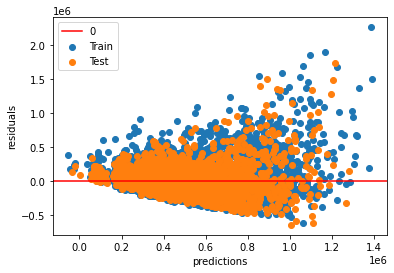

In [213]:
evaluate(y_train, X_train_2_preds, y_test, X_test_2_preds)

### Iteration 2 Evaluation
- Our second model accounts for around 47% of the varience in our data, a 7% improvement from the first model but no improvment over the first iteration.
- The RMSE has remained the same
- The MAE has remained the same
- Our scatter plot shows heteroscedasticity
- The second iteration shows that adding the square foot living area of the closest 15 neighbors does not show on it's face to have a large effect. It's P value is high, indicating that what it is bringing to the model may also be found in features already being used.

### Iteration 3

In [214]:
#Iteration using the top three correlated features
X_train_3 = X_train[['sqft_living','num_grade','lat']]
X_test_3 = X_test[['sqft_living','num_grade','lat']]

In [215]:
model_3 = sm.OLS(y_train, sm.add_constant(X_train_3)).fit()
model_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.594
Model:                            OLS   Adj. R-squared:                  0.594
Method:                 Least Squares   F-statistic:                     5495.
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        08:52:53   Log-Likelihood:            -1.5193e+05
No. Observations:               11266   AIC:                         3.039e+05
Df Residuals:                   11262   BIC:                         3.039e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -3.521e+07   5.81e+05    -60.661      0.000   -3.64e+07   -3.41e+07
sqft_living   154.6293      3.139     49.261      0.000     148.476     160.782
num_grade    8.408e+04   2347.994     35.809      0.000    7.95e+04    8.87e+04
lat          7.313e+05   1.22e+04     59.758      0.000    7.07e+05    7.55e+05
==============================================================================
Omnibus:                     6333.048   Durbin-Watson:                   2.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           107395.014
Skew:                           2.342   Prob(JB):                         0.00
Kurtosis:                      17.382   Cond. No.                     7.21e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.21e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [216]:
X_train_3_preds = model_3.predict(sm.add_constant(X_train_3))
X_test_3_preds = model_3.predict(sm.add_constant(X_test_3))

Train R2: 0.5941
Test R2: 0.5837
****
Train RMSE: $173,929.84
Test RMSE: $173,660.76
****
Train MAE: $118,514.60
Test MAE: $118,517.44


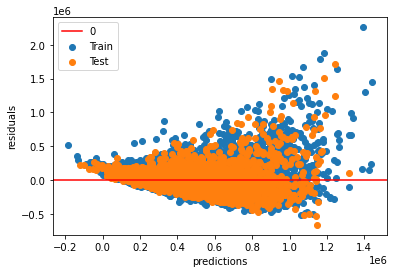

In [217]:
evaluate(y_train, X_train_3_preds, y_test, X_test_3_preds)

### Iteration 3 Evaluation
- Our third model accounts for around 59% of the varience in our data, a 12% improvement from the second iteration, a significant improvement.
- The RMSE has significantly dropped.
- The MAE has significantly dropped.
- Our scatter plot shows heteroscedasticity
- The third iteration shows that latitude has a large impact on predicting the sale price of a property. This aligns highly with our initial exploration of the mean housing prices grouped by zipcodes. This shows that the location of a property matters in determining sale price.

### Scaling Iteration 3 for closer analysis

In [218]:
scaler.fit(X_train[['sqft_living','num_grade','lat']])
scaler.fit(X_test[['sqft_living','num_grade','lat']])
X_train_3_scaled = scaler.transform(X_train[['sqft_living','num_grade','lat']])
X_test_3_scaled = scaler.transform(X_test[['sqft_living','num_grade','lat']])

In [219]:
model_3_scaled = sm.OLS(y_train_log, sm.add_constant(X_train_3_scaled)).fit()
model_3_scaled.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.681
Model:                            OLS   Adj. R-squared:                  0.681
Method:                 Least Squares   F-statistic:                     8012.
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        08:53:01   Log-Likelihood:                -1266.7
No. Observations:               11266   AIC:                             2541.
Df Residuals:                   11262   BIC:                             2571.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.9906      0.003   5091.029      0.000      12.986      12.996
x1             0.1926      0.004     52.909      0.000       0.185       0.200
x2             0.1506      0.004     41.434      0.000       0.143       0.158
x3             0.2291      0.003     88.428      0.000       0.224       0.234
==============================================================================
Omnibus:                      137.571   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              213.230
Skew:                           0.119   Prob(JB):                     4.98e-47
Kurtosis:                       3.631   Cond. No.                         2.40
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### In looking at the scaled coefficients, we can see the impact of each of our features.

- lat has the highest impact on our model with the largest coefficient at .23
- sqft_living has the second highest impact on our model with a coefficient of .19
- num_grade has the third highest impact on our model with a coefficient of .15


In [220]:
#setting our model predictions using our scaled columns
train_3_preds_log = model_3_scaled.predict(sm.add_constant(X_train_3_scaled))
test_3_preds_log = model_3_scaled.predict(sm.add_constant(X_test_3_scaled))

Train R2: 0.6810
Test R2: 0.6944
****
Train RMSE: $0.27
Test RMSE: $0.27
****
Train MAE: $0.21
Test MAE: $0.21


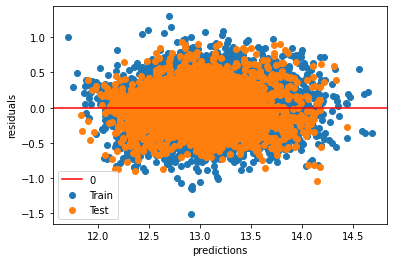

In [221]:
evaluate(y_train_log, train_3_preds_log, y_test_log, test_3_preds_log)

In [222]:
#Unlogging our columns to clearly show our RMSE and MAE
train_3_preds_unlog = np.exp(train_3_preds_log)
test_3_preds_unlog = np.exp(test_3_preds_log)

Train R2: 0.6282
Test R2: 0.6182
****
Train RMSE: $166,473.39
Test RMSE: $166,301.65
****
Train MAE: $107,803.54
Test MAE: $106,822.33


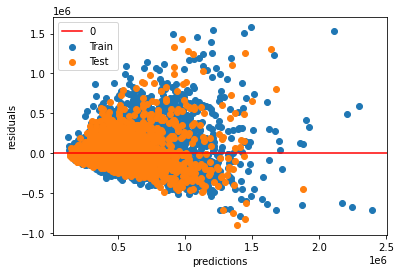

In [223]:
#Final evaluation of the model
evaluate(y_train, train_3_preds_unlog, y_test, test_3_preds_unlog)

### Iteration 4

In [224]:
#Iteration using the top four correlated features
X_train_4 = X_train[['sqft_living','num_grade','lat','bathrooms']]
X_test_4 = X_test[['sqft_living','num_grade','lat','bathrooms']]

In [225]:
model_4 = sm.OLS(y_train, sm.add_constant(X_train_4)).fit()
model_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.598
Model:                            OLS   Adj. R-squared:                  0.597
Method:                 Least Squares   F-statistic:                     4180.
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        08:53:11   Log-Likelihood:            -1.5188e+05
No. Observations:               11266   AIC:                         3.038e+05
Df Residuals:                   11261   BIC:                         3.038e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -3.467e+07   5.81e+05    -59.697      0.000   -3.58e+07   -3.35e+07
sqft_living   172.0192      3.590     47.911      0.000     164.981     179.057
num_grade    9.052e+04   2427.871     37.283      0.000    8.58e+04    9.53e+04
lat          7.196e+05   1.22e+04     58.764      0.000    6.96e+05    7.44e+05
bathrooms   -3.356e+04   3409.632     -9.844      0.000   -4.02e+04   -2.69e+04
==============================================================================
Omnibus:                     6271.282   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           106130.416
Skew:                           2.311   Prob(JB):                         0.00
Kurtosis:                      17.308   Cond. No.                     7.25e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.25e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [226]:
X_train_4_preds = model_4.predict(sm.add_constant(X_train_4))
X_test_4_preds = model_4.predict(sm.add_constant(X_test_4))

Train R2: 0.5976
Test R2: 0.5846
****
Train RMSE: $173,186.28
Test RMSE: $173,480.03
****
Train MAE: $117,781.70
Test MAE: $118,130.84


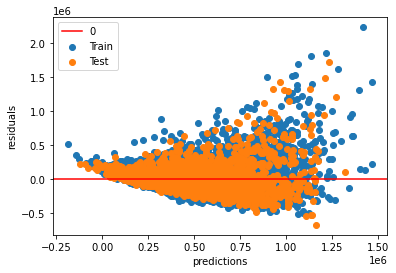

In [227]:
evaluate(y_train, X_train_4_preds, y_test, X_test_4_preds)

### Iteration 4 Evaluation
- Our fourth model accounts for around 59% of the varience in our data, a 12% improvement from the second iteration, a significant improvement.
- The RMSE has significantly dropped.
- The MAE has significantly dropped.
- Our scatter plot shows heteroscedasticity
- The third iteration shows that latitude has a large impact on predicting the sale price of a property. This aligns highly with our initial exploration of the mean housing prices grouped by zipcodes. This shows that the location of a property matters in determining sale price.

### Scaling Iteration 4 for further analysis

In [228]:
scaler.fit(X_train[['sqft_living','num_grade','lat','bathrooms']])
scaler.fit(X_test[['sqft_living','num_grade','lat','bathrooms']])
X_train_4_scaled = scaler.transform(X_train[['sqft_living','num_grade','lat','bathrooms']])
X_test_4_scaled = scaler.transform(X_test[['sqft_living','num_grade','lat','bathrooms']])

In [229]:
model_4_scaled = sm.OLS(y_train_log, sm.add_constant(X_train_4_scaled)).fit()
model_4_scaled.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.681
Model:                            OLS   Adj. R-squared:                  0.681
Method:                 Least Squares   F-statistic:                     6018.
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        08:53:18   Log-Likelihood:                -1260.9
No. Observations:               11266   AIC:                             2532.
Df Residuals:                   11261   BIC:                             2568.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.9905      0.003   5092.987      0.000      12.986      12.996
x1             0.1996      0.004     47.755      0.000       0.191       0.208
x2             0.1540      0.004     40.836      0.000       0.147       0.161
x3             0.2282      0.003     87.715      0.000       0.223       0.233
x4            -0.0130      0.004     -3.398      0.001      -0.021      -0.006
==============================================================================
Omnibus:                      132.096   Durbin-Watson:                   1.988
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              208.572
Skew:                           0.104   Prob(JB):                     5.12e-46
Kurtosis:                       3.633   Cond. No.                         3.00
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [230]:
#setting our model predictions using our scaled columns
train_4_preds_log = model_4_scaled.predict(sm.add_constant(X_train_4_scaled))
test_4_preds_log = model_4_scaled.predict(sm.add_constant(X_test_4_scaled))

Train R2: 0.6813
Test R2: 0.6943
****
Train RMSE: $0.27
Test RMSE: $0.27
****
Train MAE: $0.21
Test MAE: $0.21


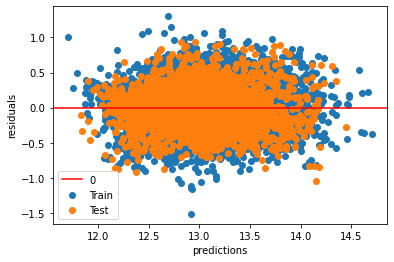

In [231]:
evaluate(y_train_log, train_4_preds_log, y_test_log, test_4_preds_log)

In [232]:
#Unlogging our columns to clearly show our RMSE and MAE
train_4_preds_unlog = np.exp(train_4_preds_log)
test_4_preds_unlog = np.exp(test_4_preds_log)

Train R2: 0.6290
Test R2: 0.6182
****
Train RMSE: $166,286.32
Test RMSE: $166,320.84
****
Train MAE: $107,827.40
Test MAE: $106,980.20


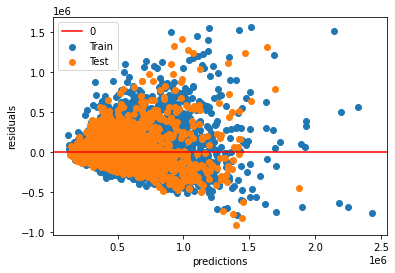

In [233]:
#Final evaluation of the model
evaluate(y_train, train_4_preds_unlog, y_test, test_4_preds_unlog)

## Exploring Feature Engineering

### Iteration 5

In [234]:
#Iteration using the top four correlated features
X_train_5 = X_train[['sqft_living','num_grade','lat','sqft_living_per_bathroom']]
X_test_5 = X_test[['sqft_living','num_grade','lat','sqft_living_per_bathroom']]

In [235]:
model_5 = sm.OLS(y_train, sm.add_constant(X_train_5)).fit()
model_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.596
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     4151.
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        08:53:28   Log-Likelihood:            -1.5190e+05
No. Observations:               11266   AIC:                         3.038e+05
Df Residuals:                   11261   BIC:                         3.038e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                    -3.483e+07   5.82e+05    -59.874      0.000    -3.6e+07   -3.37e+07
sqft_living                144.5168      3.443     41.971      0.000     137.767     151.266
num_grade                  8.84e+04   2421.437     36.509      0.000    8.37e+04    9.31e+04
lat                       7.221e+05   1.23e+04     58.798      0.000    6.98e+05    7.46e+05
sqft_living_per_bathroom    45.3444      6.413      7.070      0.000      32.773      57.915
==============================================================================
Omnibus:                     6333.111   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           108776.931
Skew:                           2.337   Prob(JB):                         0.00
Kurtosis:                      17.487   Cond. No.                     7.99e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.99e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [236]:
X_train_5_preds = model_5.predict(sm.add_constant(X_train_5))
X_test_5_preds = model_5.predict(sm.add_constant(X_test_5))

Train R2: 0.5959
Test R2: 0.5841
****
Train RMSE: $173,545.05
Test RMSE: $173,580.95
****
Train MAE: $118,130.86
Test MAE: $118,326.11


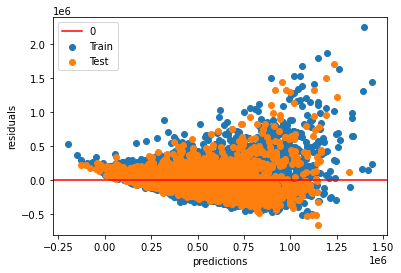

In [237]:
evaluate(y_train, X_train_5_preds, y_test, X_test_5_preds)

## 'Final' Model

Our final features used were found by evaluating each iteration of our model. The features with the strongest correlation 
#that also help inform our business proposal were kept. 

In [238]:
#Final features
final_cols = ['sqft_living','lat', 'num_grade']

In [239]:
# We initially scale our final columns so that we can compare their impact on the model later.
scaler.fit(X_train[final_cols])
scaler.fit(X_test[final_cols])
X_train_final_scaled = scaler.transform(X_train[final_cols])
X_test_final_scaled = scaler.transform(X_test[final_cols])



In [240]:
#Fitting our model
final_model = sm.OLS(y_train_log, sm.add_constant(X_train_final_scaled)).fit()
final_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.681
Model:                            OLS   Adj. R-squared:                  0.681
Method:                 Least Squares   F-statistic:                     8012.
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        08:53:35   Log-Likelihood:                -1266.7
No. Observations:               11266   AIC:                             2541.
Df Residuals:                   11262   BIC:                             2571.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.9906      0.003   5091.029      0.000      12.986      12.996
x1             0.1926      0.004     52.909      0.000       0.185       0.200
x2             0.2291      0.003     88.428      0.000       0.224       0.234
x3             0.1506      0.004     41.434      0.000       0.143       0.158
==============================================================================
Omnibus:                      137.571   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              213.230
Skew:                           0.119   Prob(JB):                     4.98e-47
Kurtosis:                       3.631   Cond. No.                         2.40
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### In looking at the scaled coefficients, we can see the impact of each of our features.

- lat has the highest impact on our model with the largest coefficient at .23
- sqft_living has the second highest impact on our model with a coefficient of .17
- num_grade has the third highest impact on our model with a coefficient of .14


In [241]:
#setting our model predictions using our scaled columns
final_train_preds_log_1 = final_model.predict(sm.add_constant(X_train_final_scaled))
final_test_preds_log_1 = final_model.predict(sm.add_constant(X_test_final_scaled))

Train R2: 0.6810
Test R2: 0.6944
****
Train RMSE: $0.27
Test RMSE: $0.27
****
Train MAE: $0.21
Test MAE: $0.21


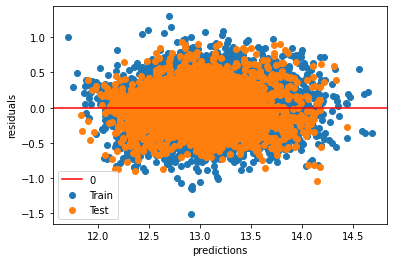

In [242]:
#Initial evaluation showing our distribution about the mean.
evaluate(y_train_log, final_train_preds_log_1, y_test_log, final_test_preds_log_1)

In [243]:
#Unlogging our columns to clearly show our RMSE and MAE
final_train_preds_unlog_1 = np.exp(final_train_preds_log_1)
final_test_preds_unlog_1 = np.exp(final_test_preds_log_1)

Train R2: 0.6282
Test R2: 0.6182
****
Train RMSE: $166,473.39
Test RMSE: $166,301.65
****
Train MAE: $107,803.54
Test MAE: $106,822.33


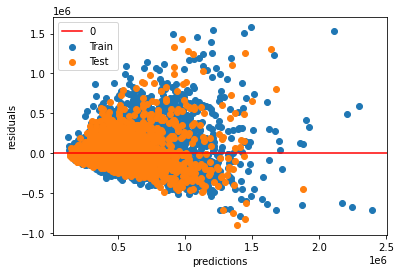

In [244]:
#Final evaluation of the model
evaluate(y_train, final_train_preds_unlog_1, y_test, final_test_preds_unlog_1)

## Conclusions


- Using a multiple linear regression model with the features latitude, living space square footage, grade, and closest 15 neighbors living space square footage, we can predict housing prices within this region within ~\\$100,000 of true price and with ~63% greater accuracy than our baseline model.

**Actionable Insights: LIHI can now use this model to predict housing prices of both listed (for sale) and unlisted (not for sale) properties.**

- Finding Bargains: By comparing the model's predicted price to the listed price, LIHI can now find under-priced homes and prioritize their purchases. (Underpriced homes are expected to arise due to various factors, including financial difficulties being experienced by the owner and a need for immediate income, as well as lenghty stretches of time that a home may remain on the market and the owner's subsequent willingness to lower the price in order to find a buyer.)

- Creating lists of eligible homes (sitting within LIHI's desired price range) that include both the listed price and our estimated price. As houses are rarely bought at the listed price, this will allow LIHI to enter the "bargaining arena" with additional knowledge on each property and the confidence needed to submit lower bids for homes that are listed at prices that do not align with our estimates. As this work, of assessing a home's "true" value would normally involve indivual work done by an employee, on each property, this model will save LIHI both time and money during this process. Additionally, by having valuable knowledge with which to "bid down" a seller, LIHI will be able to spend less money on each property, thereby allowing them to purchase more homes and house more individuals in need.



**Model Limitations**
- Because we restricted our data to better represent single family homes, if values are entered into our model that are outside of our restrictions, the predictions will not be accurate.

**Moving Forward**
- We would like to expand our scope to include other datasets that will improve the strength of our model.
- We would like to explore creating models on a city by city basis in King County to better predict home values in those cities.


